In [1]:
#importing all the libraries 
import numpy as np
import pandas as pd
import datetime as dt
from scipy import stats

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_rows', 300)

In [2]:
#importing the dataset aand checking the columns
call = pd.read_csv('H2HBABBA3078.csv')
df = pd.DataFrame(call)
df.columns

Index(['business_code', 'cust_number', 'name_customer', 'clear_date',
       'buisness_year', 'doc_id', 'posting_date', 'document_create_date',
       'document_create_date.1', 'due_in_date', 'invoice_currency',
       'document type', 'posting_id', 'area_business', 'total_open_amount',
       'baseline_create_date', 'cust_payment_terms', 'invoice_id', 'isOpen'],
      dtype='object')

In [4]:
#checking the shape of the dataframe
df.shape

(50000, 19)

In [5]:
# As we can see in the list of columns 'document_create_date' is twice, so we drop one.

df_drop = df.drop(['document_create_date.1'], axis=1)

# finding nan values 
df_drop.isna().sum()

business_code               0
cust_number                 0
name_customer               0
clear_date              10000
buisness_year               0
doc_id                      0
posting_date                0
document_create_date        0
due_in_date                 0
invoice_currency            0
document type               0
posting_id                  0
area_business           50000
total_open_amount           0
baseline_create_date        0
cust_payment_terms          0
invoice_id                  6
isOpen                      0
dtype: int64

In [6]:
# From the above sum we can see 'area_business' is totally useless as it has null values for all 50k data rows.
df_drop1 = df_drop.drop(['area_business'], axis = 1)

# There are 10000 rows with clear date missing which is useful in finding payment delay predictions, so these rows are useless.
df_drop2 = df_drop1.dropna(axis = 0, how ='any') # additionally removing those 6 null values too for invoice_id
df_drop2.shape

(39994, 17)

## Creating our Target column

In [7]:
#taking all the valuess that are needed to be predicted in main_test
main_test = df_drop1[df_drop1.clear_date.isnull()]
#function to change int into date time
def change_date(x_type):
    x = str(x_type)
    year = int(x[0:4])
    month = int(x[4:6])
    day = int(x[6:])
    return dt.datetime(year, month, day)

#checking the main_test null valuees
main_test.isna().sum()

business_code               0
cust_number                 0
name_customer               0
clear_date              10000
buisness_year               0
doc_id                      0
posting_date                0
document_create_date        0
due_in_date                 0
invoice_currency            0
document type               0
posting_id                  0
total_open_amount           0
baseline_create_date        0
cust_payment_terms          0
invoice_id                  0
isOpen                      0
dtype: int64

In [8]:
# year/month/date
# due date() - clear date(day/month/year)
# generating due date into readable format.
df_drop2['due_date'] = pd.to_datetime(df_drop2.due_in_date,format="%Y%m%d")
df_drop2['clear_date']= pd.to_datetime(df_drop2['clear_date']) 

# Creating target variable
df_drop2['delay'] = (df_drop2['clear_date'] - df_drop2['due_date']).dt.days
df_drop2.head() 
# target value +ve means there was a delay in payment.

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,due_in_date,invoice_currency,document type,posting_id,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen,due_date,delay
0,CA02,0140104409,LOB corporation,2019-07-12,2019.0,2.960558e+09,2019-06-27,20190627,20190713.0,CAD,RV,1.0,73819.20,20190703.0,CA10,2.960558e+09,0,2019-07-13,-1
1,U001,0200759878,SA co,2019-08-13,2019.0,1.929653e+09,2019-07-25,20190723,20190809.0,USD,RV,1.0,45947.47,20190725.0,NAH4,1.929653e+09,0,2019-08-09,4
2,U001,0200920735,ALBERT corporation,2020-02-27,2020.0,1.930515e+09,2020-02-12,20200211,20200227.0,USD,RV,1.0,144116.00,20200212.0,NAA8,1.930515e+09,0,2020-02-27,0
4,U001,0200942148,BRADY corp,2019-06-07,2019.0,1.929112e+09,2019-04-09,20190409,20190509.0,USD,RV,1.0,15940.80,20190409.0,NAD5,1.929112e+09,0,2019-05-09,29
5,U001,200769623,WAL-MAR us,2019-03-25,2019.0,1.928942e+09,2019-03-11,20190310,20190326.0,USD,RV,1.0,289.56,20190311.0,NAH4,1.928942e+09,0,2019-03-26,-1


In [10]:
df_drop2.head(1)

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,due_in_date,invoice_currency,document type,posting_id,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen,due_date,delay
0,CA02,0140104409,LOB corporation,2019-07-12,2019.0,2.960558e+09,2019-06-27,20190627,20190713.0,CAD,RV,1.0,73819.2,20190703.0,CA10,2.960558e+09,0,2019-07-13,-1


## Training and Splitting the data

In [11]:
df_drop2['document_create_date'] = df_drop2['document_create_date'].apply(change_date)
df_drop2['baseline_create_date'] = pd.to_datetime(df_drop2.baseline_create_date,format="%Y%m%d")

print(pd.to_datetime(df_drop2['document_create_date']).min()) 
print(pd.to_datetime(df_drop2['document_create_date']).max())

2018-12-26 00:00:00
2020-03-02 00:00:00


In [12]:
# Splitting the initial dataframe into train and test
# So in this case we can consider last 3 months for test set.
x_train = df_drop2[df_drop2['document_create_date'] <= '2020-01-01'].copy()
x_test = df_drop2[df_drop2['document_create_date'] > '2020-01-01'].copy()


In [14]:
print(x_train.shape)
print(x_test.shape)

(34941, 19)
(5053, 19)


In [16]:
x_train.head()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,due_in_date,invoice_currency,document type,posting_id,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen,due_date,delay
0,CA02,0140104409,LOB corporation,2019-07-12,2019.0,2.960558e+09,2019-06-27,2019-06-27,20190713.0,CAD,RV,1.0,73819.20,2019-07-03,CA10,2.960558e+09,0,2019-07-13,-1
1,U001,0200759878,SA co,2019-08-13,2019.0,1.929653e+09,2019-07-25,2019-07-23,20190809.0,USD,RV,1.0,45947.47,2019-07-25,NAH4,1.929653e+09,0,2019-08-09,4
4,U001,0200942148,BRADY corp,2019-06-07,2019.0,1.929112e+09,2019-04-09,2019-04-09,20190509.0,USD,RV,1.0,15940.80,2019-04-09,NAD5,1.929112e+09,0,2019-05-09,29
5,U001,200769623,WAL-MAR us,2019-03-25,2019.0,1.928942e+09,2019-03-11,2019-03-10,20190326.0,USD,RV,1.0,289.56,2019-03-11,NAH4,1.928942e+09,0,2019-03-26,-1
7,U001,0200353024,DECA us,2019-11-08,2019.0,1.930124e+09,2019-11-07,2019-11-07,20191111.0,USD,RV,1.0,12346.64,2019-11-01,NAM2,1.930124e+09,0,2019-11-11,-3


## EDA and Feature Engineering

In [17]:
# business_code, invoice_currency, document type, posting_id, cust_payment_terms
print(dict(x_train['business_code'].value_counts()))
print(dict(x_test['business_code'].value_counts()))

{'U001': 31540, 'CA02': 2806, 'U013': 465, 'U002': 116, 'U005': 11, 'U007': 3}
{'U001': 4571, 'CA02': 378, 'U013': 84, 'U002': 17, 'U005': 3}


In [18]:
print(dict(x_train['invoice_currency'].value_counts()))
print(dict(x_test['invoice_currency'].value_counts()))

{'USD': 32135, 'CAD': 2806}
{'USD': 4675, 'CAD': 378}


In [19]:
print(dict(x_train['isOpen'].value_counts()))
print(dict(x_test['isOpen'].value_counts()))

{0: 34941}
{0: 5053}


In [20]:
print(dict(x_train['document type'].value_counts()))
print(dict(x_test['document type'].value_counts()))

{'RV': 34941}
{'RV': 5053}


In [21]:
print(dict(x_train['posting_id'].value_counts()))
print(dict(x_test['posting_id'].value_counts()))

{1.0: 34941}
{1.0: 5053}


In [22]:
print(dict(x_train['cust_payment_terms'].value_counts()))
# a little cramped but this gives the idea.
print()
print(dict(x_test['cust_payment_terms'].value_counts()))

{'NAA8': 14070, 'NAH4': 9209, 'CA10': 2716, 'NAC6': 1152, 'NAM4': 966, 'NAAX': 858, 'NAD1': 707, 'NAG2': 664, 'NAU5': 658, 'NAGD': 511, 'NA32': 507, 'NAX2': 470, 'NAM2': 368, 'NA10': 300, 'NAD5': 209, 'NAVE': 206, 'NAM1': 183, 'NAVF': 175, 'NAAW': 157, 'NAWU': 134, 'NAWN': 92, 'NAVR': 88, 'NAVQ': 76, 'NAWP': 63, 'NAUZ': 53, 'CA30': 35, 'NA3B': 34, 'NACB': 29, 'NAVM': 27, 'NA38': 21, 'NAB1': 19, 'C106': 19, 'NABG': 18, 'NA9X': 14, 'BR56': 13, 'NAD4': 10, 'NA84': 10, 'NAVD': 9, 'NAVL': 9, 'NA3F': 8, 'CAB1': 5, 'CAX2': 5, 'NAUP': 5, 'NATL': 4, 'NAUI': 4, 'NA25': 4, 'NATX': 4, 'NA8Q': 3, 'NATJ': 3, 'NAV9': 3, 'NAWM': 3, 'NATW': 3, 'BR12': 3, 'NAM3': 3, 'NATU': 3, 'NATK': 2, 'NATM': 2, 'NATV': 2, 'NAVC': 2, 'NAUX': 1, 'NAUW': 1, 'NANC': 1, 'NAV2': 1, 'NATH': 1, 'NABD': 1, 'C129': 1, 'NAUY': 1, 'MC15': 1, 'NA31': 1, '90M7': 1}

{'NAA8': 1956, 'NAH4': 1361, 'CA10': 373, 'NAC6': 162, 'NAAX': 136, 'NAM4': 130, 'NAD1': 114, 'NAGD': 102, 'NAG2': 95, 'NAU5': 91, 'NAX2': 80, 'NA32': 79, 'NAM2': 77,

In [23]:
x_train.describe()

,buisness_year,doc_id,due_in_date,posting_id,total_open_amount,invoice_id,isOpen,delay
count,34941.000000,3.494100e+04,3.494100e+04,34941.0,3.494100e+04,3.494100e+04,34941.0,34941.000000
mean,2019.008758,2.013319e+09,2.019083e+07,1.0,3.265733e+04,2.013319e+09,0.0,0.935491
std,0.093173,2.800250e+08,1.165888e+03,0.0,4.188560e+04,2.800250e+08,0.0,10.925591
min,2019.000000,1.928502e+09,2.018123e+07,1.0,1.780000e+00,1.928502e+09,0.0,-76.000000
25%,2019.000000,1.929108e+09,2.019042e+07,1.0,4.701450e+03,1.929108e+09,0.0,-3.000000
50%,2019.000000,1.929620e+09,2.019071e+07,1.0,1.732550e+04,1.929620e+09,0.0,0.000000
75%,2019.000000,1.930035e+09,2.019101e+07,1.0,4.683125e+04,1.930035e+09,0.0,2.000000
max,2020.000000,2.960605e+09,2.020041e+07,1.0,1.506681e+06,2.960605e+09,0.0,282.000000


In [24]:
# we get to see that posting_id,document type and isOpen bboth have just one value for all data, so we remove them.
X_train = x_train.drop(['posting_id', 'document type', 'isOpen'], axis = 1)
X_test = x_test.drop(['posting_id', 'document type', 'isOpen'], axis = 1)

In [25]:
X_train.head()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,due_in_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,due_date,delay
0,CA02,0140104409,LOB corporation,2019-07-12,2019.0,2.960558e+09,2019-06-27,2019-06-27,20190713.0,CAD,73819.20,2019-07-03,CA10,2.960558e+09,2019-07-13,-1
1,U001,0200759878,SA co,2019-08-13,2019.0,1.929653e+09,2019-07-25,2019-07-23,20190809.0,USD,45947.47,2019-07-25,NAH4,1.929653e+09,2019-08-09,4
4,U001,0200942148,BRADY corp,2019-06-07,2019.0,1.929112e+09,2019-04-09,2019-04-09,20190509.0,USD,15940.80,2019-04-09,NAD5,1.929112e+09,2019-05-09,29
5,U001,200769623,WAL-MAR us,2019-03-25,2019.0,1.928942e+09,2019-03-11,2019-03-10,20190326.0,USD,289.56,2019-03-11,NAH4,1.928942e+09,2019-03-26,-1
7,U001,0200353024,DECA us,2019-11-08,2019.0,1.930124e+09,2019-11-07,2019-11-07,20191111.0,USD,12346.64,2019-11-01,NAM2,1.930124e+09,2019-11-11,-3


<AxesSubplot:xlabel='business_code', ylabel='delay'>

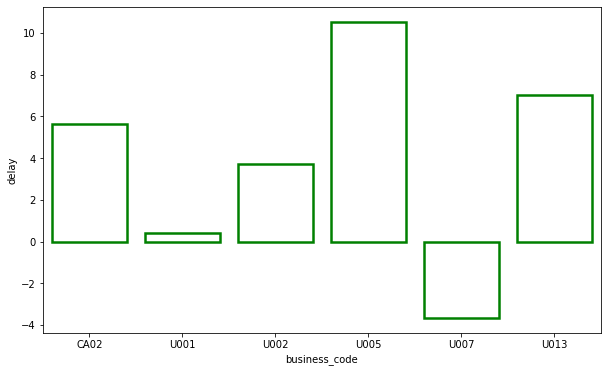

In [26]:
temp = pd.DataFrame(X_train.groupby(['business_code'], axis=0, as_index=False)['delay'].mean())
plt.figure(figsize=(10,6))
sns.barplot(x="business_code", y="delay",data=temp,linewidth=2.5, facecolor=(1, 1, 1, 0),
                 errcolor=".4", edgecolor="green")

In [27]:
# The above graph shows that CA02,U001,U002, U005 and U013 code are the ones that delay their payments.

In [28]:
# Encoding the binary categorical column invoice_currency
#label encoding where usd is 0 and cad is 1
X_train['invoice_currency'] = X_train['invoice_currency'].map({'USD': 0,'CAD': 1})
X_test['invoice_currency'] = X_test['invoice_currency'].map({'USD': 0,'CAD': 1})

<AxesSubplot:xlabel='invoice_currency', ylabel='delay'>

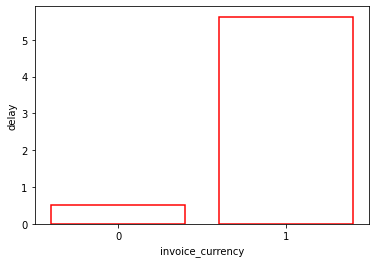

In [30]:
temp1 = pd.DataFrame(X_train.groupby(['invoice_currency'], axis=0, as_index=False)['delay'].mean())
plt.figure(figsize=(6,4))
sns.barplot(x="invoice_currency", y="delay",data=temp1,linewidth=1.5, facecolor=(1, 1, 1, 0),
                 errcolor=".2", edgecolor="red")

#### This shows USD currency deliveries have very less delays in payment as such.

<AxesSubplot:xlabel='total_open_amount', ylabel='Density'>

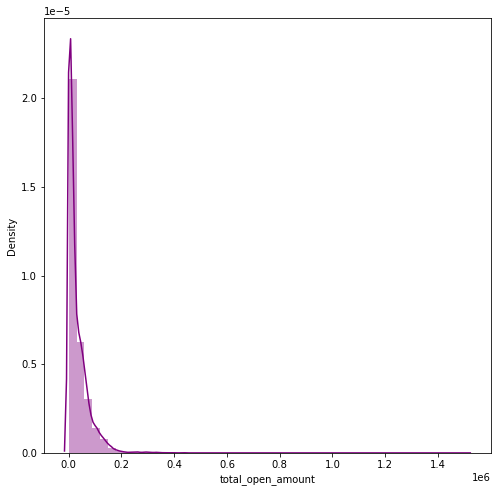

In [32]:
plt.figure(figsize=(8,8))
plt.figure(1)
sns.distplot(X_train['total_open_amount'],color='purple')

#### This shows the amount column is totally right skewed which puts strain on the bias of this data.

In [33]:
# Using log transformation to make it more 'normal' for better analysis
def Transform(x):
    return np.log(x)

X_train['total_open_amount'] = X_train['total_open_amount'].apply(Transform)
X_test['total_open_amount'] = X_test['total_open_amount'].apply(Transform)

In [36]:
X_train['cust_number'].nunique()

1291

In [37]:
# This pretty much doesnt give much info as its unique for each row
X_train['invoice_id'].nunique()

34200

In [38]:
# Dropping those columns which don't contribute anything for predictions.
X_train = X_train.drop(['buisness_year', 'due_in_date'], axis = 1)
X_test = X_test.drop(['buisness_year', 'due_in_date'], axis = 1)

In [41]:
X_train.head(1)
X_train.shape

(34941, 14)

<AxesSubplot:xlabel='delay', ylabel='Density'>

<Figure size 432x432 with 0 Axes>

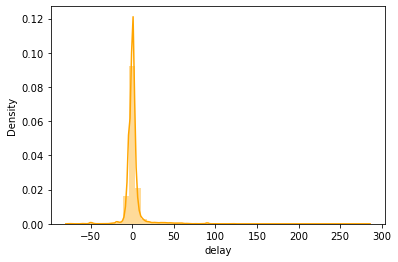

In [42]:
plt.figure(figsize=(6,6))
plt.figure(2)
sns.distplot(X_train['delay'],color='orange')

###### This is pretty much symmetric meaning normalised already.

In [43]:
#changing cust_number into integer values in X_train
def integers(x):
    ref = dict(X_train['cust_number'].value_counts())
    if ref.get(x):
        return ref[x]

X_train['cust_number'] = X_train['cust_number'].apply(integers)

In [44]:
#changing cust_number into integer values in X_train
def integers_test(x):
    ref = dict(X_test['cust_number'].value_counts())
    if ref.get(x):
        return ref[x]
    
X_test['cust_number'] = X_test['cust_number'].apply(integers_test)

In [45]:
X_train.head(3)

,business_code,cust_number,name_customer,clear_date,doc_id,posting_date,document_create_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,due_date,delay
0,CA02,377,LOB corporation,2019-07-12,2.960558e+09,2019-06-27,2019-06-27,1,11.209374,2019-07-03,CA10,2.960558e+09,2019-07-13,-1
1,U001,917,SA co,2019-08-13,1.929653e+09,2019-07-25,2019-07-23,0,10.735254,2019-07-25,NAH4,1.929653e+09,2019-08-09,4
4,U001,20,BRADY corp,2019-06-07,1.929112e+09,2019-04-09,2019-04-09,0,9.676637,2019-04-09,NAD5,1.929112e+09,2019-05-09,29


In [47]:
X_train.dtypes
X_train['business_code'].value_counts()

U001    31540
CA02     2806
U013      465
U002      116
U005       11
U007        3
Name: business_code, dtype: int64

In [48]:
# It is clear that U002 afterwards all business codes are meager so we take it as others.

X_train = X_train.replace(['U002', 'U005', 'U007'], 'other')
X_test = X_test.replace(['U002', 'U005', 'U007'], 'other')

business = pd.get_dummies(X_train['business_code'])
business1 = pd.get_dummies(X_test['business_code'])
# Above in the business_code column we can see they are categorical ones, so we make new feature
# out of them 
X_train = pd.concat([X_train, business], axis=1)
X_test = pd.concat([X_test, business1], axis=1)

X_train.head()

,business_code,cust_number,name_customer,clear_date,doc_id,posting_date,document_create_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,due_date,delay,CA02,U001,U013,other
0,CA02,377,LOB corporation,2019-07-12,2.960558e+09,2019-06-27,2019-06-27,1,11.209374,2019-07-03,CA10,2.960558e+09,2019-07-13,-1,1,0,0,0
1,U001,917,SA co,2019-08-13,1.929653e+09,2019-07-25,2019-07-23,0,10.735254,2019-07-25,NAH4,1.929653e+09,2019-08-09,4,0,1,0,0
4,U001,20,BRADY corp,2019-06-07,1.929112e+09,2019-04-09,2019-04-09,0,9.676637,2019-04-09,NAD5,1.929112e+09,2019-05-09,29,0,1,0,0
5,U001,674,WAL-MAR us,2019-03-25,1.928942e+09,2019-03-11,2019-03-10,0,5.668363,2019-03-11,NAH4,1.928942e+09,2019-03-26,-1,0,1,0,0
7,U001,241,DECA us,2019-11-08,1.930124e+09,2019-11-07,2019-11-07,0,9.421139,2019-11-01,NAM2,1.930124e+09,2019-11-11,-3,0,1,0,0


In [49]:
# creating a new feature from baseline column.
X_train['baseline_quater']= pd.to_datetime(X_train['baseline_create_date']).dt.quarter
X_test['baseline_quater']= pd.to_datetime(X_test['baseline_create_date']).dt.quarter
X_train.head()

,business_code,cust_number,name_customer,clear_date,doc_id,posting_date,document_create_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,due_date,delay,CA02,U001,U013,other,baseline_quater
0,CA02,377,LOB corporation,2019-07-12,2.960558e+09,2019-06-27,2019-06-27,1,11.209374,2019-07-03,CA10,2.960558e+09,2019-07-13,-1,1,0,0,0,3
1,U001,917,SA co,2019-08-13,1.929653e+09,2019-07-25,2019-07-23,0,10.735254,2019-07-25,NAH4,1.929653e+09,2019-08-09,4,0,1,0,0,3
4,U001,20,BRADY corp,2019-06-07,1.929112e+09,2019-04-09,2019-04-09,0,9.676637,2019-04-09,NAD5,1.929112e+09,2019-05-09,29,0,1,0,0,2
5,U001,674,WAL-MAR us,2019-03-25,1.928942e+09,2019-03-11,2019-03-10,0,5.668363,2019-03-11,NAH4,1.928942e+09,2019-03-26,-1,0,1,0,0,1
7,U001,241,DECA us,2019-11-08,1.930124e+09,2019-11-07,2019-11-07,0,9.421139,2019-11-01,NAM2,1.930124e+09,2019-11-11,-3,0,1,0,0,4


In [51]:
#checking how many diff cust_payment_terms are there
X_train['cust_payment_terms'].value_counts()

NAA8    14070
NAH4     9209
CA10     2716
NAC6     1152
NAM4      966
NAAX      858
NAD1      707
NAG2      664
NAU5      658
NAGD      511
NA32      507
NAX2      470
NAM2      368
NA10      300
NAD5      209
NAVE      206
NAM1      183
NAVF      175
NAAW      157
NAWU      134
NAWN       92
NAVR       88
NAVQ       76
NAWP       63
NAUZ       53
CA30       35
NA3B       34
NACB       29
NAVM       27
NA38       21
NAB1       19
C106       19
NABG       18
NA9X       14
BR56       13
NAD4       10
NA84       10
NAVD        9
NAVL        9
NA3F        8
CAB1        5
CAX2        5
NAUP        5
NATL        4
NAUI        4
NA25        4
NATX        4
NA8Q        3
NATJ        3
NAV9        3
NAWM        3
NATW        3
BR12        3
NAM3        3
NATU        3
NATK        2
NATM        2
NATV        2
NAVC        2
NAUX        1
NAUW        1
NANC        1
NAV2        1
NATH        1
NABD        1
C129        1
NAUY        1
MC15        1
NA31        1
90M7        1
Name: cust_payment_t

In [52]:
#reducing the number of categories by combining the same together
X_train = X_train.replace(['NAA8', 'NAAX', 'NAAW'], 'NAA')

X_train = X_train.replace(['NAGD', 'NAUZ', 'NAVF', 'NAVE', 'NAVR', 'NAWN', 'NAVQ',
                                  'NAWP', 'NAVM', 'NACB', 'NABG','NAVD', 'NAVL', 'NAUP', 'NATJ', 'NATH', 
                                  'NATU', 'NA8Q', 'NAVC', 'NANC', 'NATK', 'NAUI', 'NAWM',
                                  'NATL', 'NAUY', 'NATZ', 'NACE', 'NATZ','NAWU','NATX','NATW','NATM','NATV','NAUX','NAUW','NABD'], 'NA_place')

X_train = X_train.replace(['NAH4', 'NAC6', 'NAM4', 'NAD1', 'NAU5', 'NAG2', 'NAX2', 'NAD5', 'NAM1',
                                  'NAD4','NAB1','NAM2','NAM3', 'NAV9',  'NAV2', 'NAD8'], 'NA_letter_number')

X_train = X_train.replace(['NA3B', 'NA3F', 'NA9X'], 'NA_number_letter')

X_train = X_train.replace(['NA32', 'NA10', 'NA38', 'NA84', 'NA25', 'NA31'], 'NA_number_number')

X_train = X_train.replace(['CA10', 'CA30', 'C106', 'CAX2', 'CAB1', 'C129', 'CA60'], 'CA')
X_train = X_train.replace(['C106', 'C129', '90M7'], 'C_number')

X_train = X_train.replace(['BR56', 'B030', 'B052','BR12'], 'B')
X_train = X_train.replace(['MC15'], 'M')

X_train['cust_payment_terms'].value_counts()

NAA                 15085
NA_letter_number    14622
CA                   2781
NA_place             1536
NA_number_number      843
NA_number_letter       56
B                      16
C_number                1
M                       1
Name: cust_payment_terms, dtype: int64

In [53]:
#reducing the samme in X_test
X_test = X_test.replace(['NAA8', 'NAAX', 'NAAW'], 'NAA')

X_test = X_test.replace(['NAGD', 'NAUZ', 'NAVF', 'NAVE', 'NAVR', 'NAWN', 'NAVQ',
                                  'NAWP', 'NAVM', 'NACB', 'NABG','NAVD', 'NAVL', 'NAUP', 'NATJ', 'NATH', 
                                  'NATU', 'NA8Q', 'NAVC', 'NANC', 'NATK', 'NAUI', 'NAWM',
                                  'NATL', 'NAUY', 'NATZ', 'NACE', 'NATZ'], 'NA_place')

X_test = X_test.replace(['NAH4', 'NAC6', 'NAM4', 'NAD1', 'NAU5', 'NAG2', 'NAX2', 'NAD5', 'NAM1',
                                  'NAD4','NAB1','NAM2','NAM3', 'NAV9',  'NAV2', 'NAD8'], 'NA_letter_number')

X_test = X_test.replace(['NA3B', 'NA3F', 'NA9X'], 'NA_number_letter')

X_test = X_test.replace(['NA32', 'NA10', 'NA38', 'NA84', 'NA25', 'NA31'], 'NA_number_number')

X_test = X_test.replace(['CA10', 'CA30', 'C106', 'CAX2', 'CAB1', 'C129', 'CA60'], 'CA')

X_test = X_test.replace(['C106', 'C129', '90M7'], 'C_number')

X_test = X_test.replace(['BR56', 'B030', 'B052','BR12'], 'B')

X_test['cust_payment_terms'].value_counts()

NA_letter_number    2184
NAA                 2110
CA                   381
NA_place             229
NA_number_number     142
C_number               3
B                      2
NA_number_letter       2
Name: cust_payment_terms, dtype: int64

In [54]:
# See however a discrepency has occurred i.e. there is no column of M
# so we just add a column M with values 0.
X_test['M'] = np.zeros(5053)
X_test.head(3)


,business_code,cust_number,name_customer,clear_date,doc_id,posting_date,document_create_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,due_date,delay,CA02,U001,U013,other,baseline_quater,M
2,U001,8,ALBERT corporation,2020-02-27,1.930515e+09,2020-02-12,2020-02-11,0,11.878374,2020-02-12,NAA,1.930515e+09,2020-02-27,0,0,1,0,0,1,0.0
11,U001,14,JET trust,2020-02-11,1.930427e+09,2020-01-22,2020-01-22,0,8.874564,2020-01-22,NA_letter_number,1.930427e+09,2020-02-11,0,0,1,0,0,1,0.0
12,U001,245,BJ'S in,2020-01-21,1.930366e+09,2020-01-06,2020-01-07,0,5.688770,2020-01-06,NAA,1.930366e+09,2020-01-21,0,0,1,0,0,1,0.0


In [55]:
payment = pd.get_dummies(X_train['cust_payment_terms'])
payment1 = pd.get_dummies(X_test['cust_payment_terms'])

# Above in the cust_payment_terms column we can see they are categorical ones, so we make new feature
# out of them 
X_final = pd.concat([X_train, payment], axis=1)
X_final_test = pd.concat([X_test, payment1], axis=1)

X_final.head(1)

,business_code,cust_number,name_customer,clear_date,doc_id,posting_date,document_create_date,invoice_currency,total_open_amount,baseline_create_date,...,baseline_quater,B,CA,C_number,M,NAA,NA_letter_number,NA_number_letter,NA_number_number,NA_place
0,CA02,377,LOB corporation,2019-07-12,2.960558e+09,2019-06-27,2019-06-27,1,11.209374,2019-07-03,...,3,0,1,0,0,0,0,0,0,0


In [56]:
X_final_test.head(15)

,business_code,cust_number,name_customer,clear_date,doc_id,posting_date,document_create_date,invoice_currency,total_open_amount,baseline_create_date,...,baseline_quater,M,B,CA,C_number,NAA,NA_letter_number,NA_number_letter,NA_number_number,NA_place
2,U001,8,ALBERT corporation,2020-02-27,1.930515e+09,2020-02-12,2020-02-11,0,11.878374,2020-02-12,...,1,0.0,0,0,0,1,0,0,0,0
11,U001,14,JET trust,2020-02-11,1.930427e+09,2020-01-22,2020-01-22,0,8.874564,2020-01-22,...,1,0.0,0,0,0,0,1,0,0,0
12,U001,245,BJ'S in,2020-01-21,1.930366e+09,2020-01-06,2020-01-07,0,5.688770,2020-01-06,...,1,0.0,0,0,0,1,0,0,0,0
18,U001,156,SA in,2020-02-28,1.930510e+09,2020-02-11,2020-02-11,0,10.569514,2020-02-11,...,1,0.0,0,0,0,0,1,0,0,0
24,U001,92,ASSOCIAT corp,2020-01-24,1.930378e+09,2020-01-08,2020-01-09,0,11.026045,2020-01-08,...,1,0.0,0,0,0,0,1,0,0,0
34,U001,1211,WAL-MAR,2020-02-03,1.930422e+09,2020-01-23,2020-01-21,0,9.874177,2020-01-23,...,1,0.0,0,0,0,0,1,0,0,0
47,U001,1211,WAL-MAR corp,2020-03-03,1.930558e+09,2020-02-22,2020-02-22,0,9.497582,2020-02-22,...,1,0.0,0,0,0,0,1,0,0,0
48,U001,6,PERISH,2020-02-03,1.930412e+09,2020-01-17,2020-01-17,0,11.460307,2020-01-17,...,1,0.0,0,0,0,1,0,0,0,0
53,U001,245,BJ'S corp,2020-02-24,1.930493e+09,2020-02-07,2020-02-06,0,6.804570,2020-02-07,...,1,0.0,0,0,0,1,0,0,0,0
57,U001,17,C corporation,2020-01-27,1.930372e+09,2020-01-08,2020-01-08,0,9.820772,2020-01-08,...,1,0.0,0,0,0,1,0,0,0,0


In [57]:
X_final.columns

Index(['business_code', 'cust_number', 'name_customer', 'clear_date', 'doc_id',
       'posting_date', 'document_create_date', 'invoice_currency',
       'total_open_amount', 'baseline_create_date', 'cust_payment_terms',
       'invoice_id', 'due_date', 'delay', 'CA02', 'U001', 'U013', 'other',
       'baseline_quater', 'B', 'CA', 'C_number', 'M', 'NAA',
       'NA_letter_number', 'NA_number_letter', 'NA_number_number', 'NA_place'],
      dtype='object')

<AxesSubplot:>

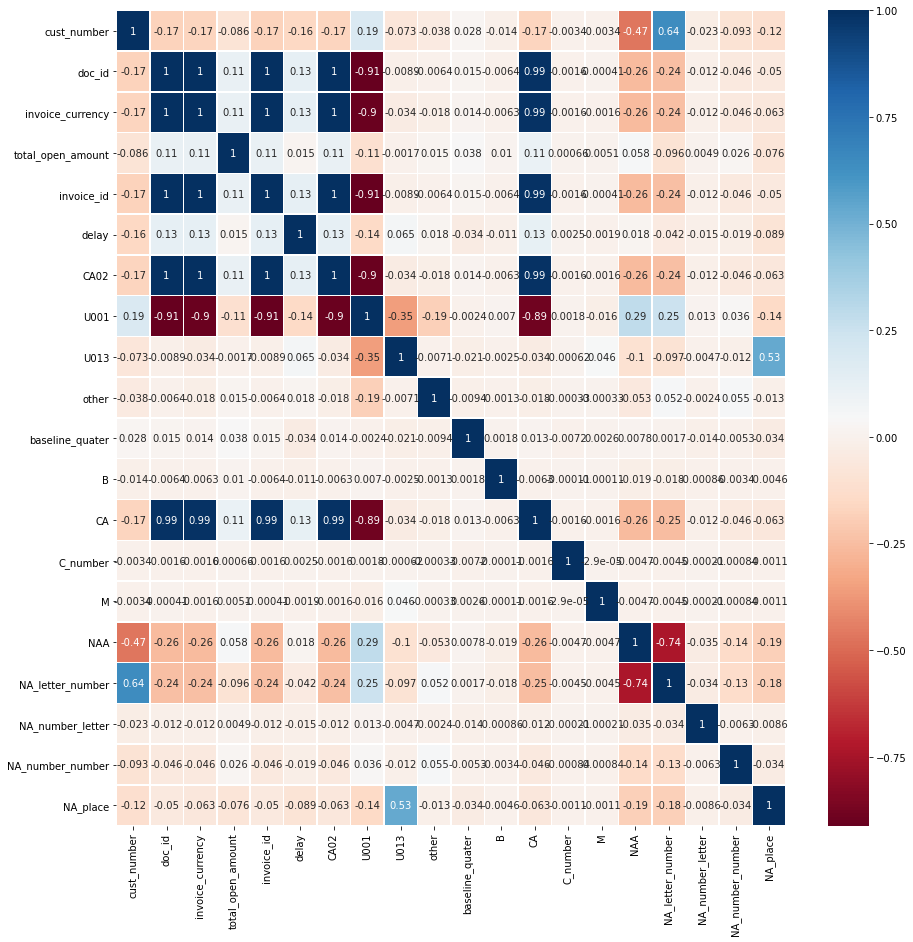

In [58]:
# X_final.columns
#plotting a heatmap to check coorelations
colormap = plt.cm.RdBu
plt.figure(figsize=(15,15))
sns.heatmap(X_final.corr(),annot=True, cmap=colormap, linecolor='white', linewidths=.5)

    

In [59]:
# dropping columns that won't help in predictions. Note on feature has high correlation with target variable.
X_final = X_final.drop(['doc_id', 'invoice_id','business_code', 'name_customer', 'clear_date',
                       'posting_date', 'document_create_date', 'baseline_create_date', 'cust_payment_terms',
                       'invoice_id', 'due_date'], axis = 1)
#to check the prediction is correct we make another instancce of prediction
prediction=X_final_test

X_final_test = X_final_test.drop(['doc_id', 'invoice_id','business_code', 'name_customer', 'clear_date',
                       'posting_date', 'document_create_date', 'baseline_create_date', 'cust_payment_terms',
                       'invoice_id', 'due_date'], axis = 1)

In [60]:
X_final.columns

Index(['cust_number', 'invoice_currency', 'total_open_amount', 'delay', 'CA02',
       'U001', 'U013', 'other', 'baseline_quater', 'B', 'CA', 'C_number', 'M',
       'NAA', 'NA_letter_number', 'NA_number_letter', 'NA_number_number',
       'NA_place'],
      dtype='object')

## Training and splitting

In [61]:
#splitting in train,test and validation set
y = X_final['delay']
X_final = X_final.drop(['delay'], axis = 1)
train_ratio = 0.70
validation_ratio = 0.15
test_ratio = 0.15

X_main_test = main_test.drop(['clear_date'],axis=1)
X_main_test = X_main_test.dropna(axis = 0, how ='any')
# train is now 75% of the entire data set
# the _junk suffix means that we drop that variable completely
xtrain, xtest, ytrain, ytest = train_test_split(X_final, y, test_size=1 - train_ratio)

# test is now 10% of the initial data set
# validation is now 15% of the initial data set
xval, xtest, yval, test = train_test_split(xtest, ytest, test_size=test_ratio/(test_ratio + validation_ratio)) 


In [62]:
X_main_test.columns

#creating another instance of main dataset that is needed to be predicted so that it doesn't goes under any changes
MAIN=X_main_test

In [63]:
#X_main_test = X_main_test.dropna(axis = 0, how ='any')

In [65]:
X_final_test.columns

Index(['cust_number', 'invoice_currency', 'total_open_amount', 'delay', 'CA02',
       'U001', 'U013', 'other', 'baseline_quater', 'M', 'B', 'CA', 'C_number',
       'NAA', 'NA_letter_number', 'NA_number_letter', 'NA_number_number',
       'NA_place'],
      dtype='object')

In [66]:
#performing the same feature engineering on main dataset so there isn't any unkown feature
X_main_test = X_main_test.replace(['U002', 'U005', 'U007'], 'other')

In [67]:
business2 = pd.get_dummies(X_main_test['business_code'])
X_main_test = pd.concat([X_main_test, business2], axis=1)
business2

,CA02,U001,U013,other
3,0,1,0,0
6,0,1,0,0
8,0,1,0,0
20,0,1,0,0
21,0,1,0,0
...,...,...,...,...
49969,0,1,0,0
49975,0,1,0,0
49980,0,1,0,0
49981,0,1,0,0


In [68]:
X_main_test.columns

Index(['business_code', 'cust_number', 'name_customer', 'buisness_year',
       'doc_id', 'posting_date', 'document_create_date', 'due_in_date',
       'invoice_currency', 'document type', 'posting_id', 'total_open_amount',
       'baseline_create_date', 'cust_payment_terms', 'invoice_id', 'isOpen',
       'CA02', 'U001', 'U013', 'other'],
      dtype='object')

In [69]:
def integers_test(x):
    ref = dict(X_main_test['cust_number'].value_counts())
    if ref.get(x):
        return ref[x]
    
X_main_test['cust_number'] = X_main_test['cust_number'].apply(integers_test)

In [70]:
X_main_test['baseline_quater']= pd.to_datetime(X_main_test['baseline_create_date']).dt.quarter

In [71]:
X_main_test = X_main_test.replace(['NAA8', 'NAAX', 'NAAW'], 'NAA')

X_main_test = X_main_test.replace(['NAGD', 'NAUZ', 'NAVF', 'NAVE', 'NAVR', 'NAWN', 'NAVQ',
                                  'NAWP', 'NAVM', 'NACB', 'NABG','NAVD', 'NAVL', 'NAUP', 'NATJ', 'NATH', 
                                  'NATU', 'NA8Q', 'NAVC', 'NANC', 'NATK', 'NAUI', 'NAWM',
                                  'NATL', 'NAUY', 'NATZ', 'NACE', 'NATZ','NACH','NACG','NAWU','NATX','NATW','NATM','NATV','NAUX','NAUW','NABD'], 'NA_place')

X_main_test = X_main_test.replace(['NAH4', 'NAC6', 'NAM4', 'NAD1', 'NAU5', 'NAG2', 'NAX2', 'NAD5', 'NAM1',
                                  'NAD4','NAB1','NAM2','NAM3', 'NAV9',  'NAV2', 'NAD8'], 'NA_letter_number')

X_main_test = X_main_test.replace(['NA3B', 'NA3F', 'NA9X'], 'NA_number_letter')

X_main_test = X_main_test.replace(['NA32', 'NA10', 'NA38', 'NA84', 'NA25', 'NA31'], 'NA_number_number')

X_main_test = X_main_test.replace(['CA10', 'CA30', 'C106', 'CAX2', 'CAB1', 'C129', 'CA60'], 'CA')
X_main_test = X_main_test.replace(['C106', 'C129', '90M7'], 'C_number')

X_main_test = X_main_test.replace(['BR56', 'B030', 'B052','BR12'], 'B')
X_main_test = X_main_test.replace(['MC15'], 'M')

X_main_test['cust_payment_terms'].value_counts()

NA_letter_number    4451
NAA                 4319
CA                   688
NA_place             385
NA_number_number     149
NA_number_letter       5
B                      3
Name: cust_payment_terms, dtype: int64

In [72]:
X_main_test['M'] = np.zeros(10000)
X_main_test['C_number'] = np.zeros(10000)
X_main_test.head(3)


,business_code,cust_number,name_customer,buisness_year,doc_id,posting_date,document_create_date,due_in_date,invoice_currency,document type,...,cust_payment_terms,invoice_id,isOpen,CA02,U001,U013,other,baseline_quater,M,C_number
3,U001,279,TARG us,2020.0,1.930654e+09,2020-03-17,20200315,20200401.0,USD,RV,...,NAA,1.930654e+09,1,0,1,0,0,1,0.0,0.0
6,U001,387,BJ'S corporation,2020.0,1.930605e+09,2020-03-05,20200305,20200320.0,USD,RV,...,NAA,1.930605e+09,1,0,1,0,0,1,0.0,0.0
8,U001,22,SUPER co,2020.0,1.930666e+09,2020-03-18,20200318,20200402.0,USD,RV,...,NAA,1.930666e+09,1,0,1,0,0,1,0.0,0.0


In [73]:
payment2 = pd.get_dummies(X_main_test['cust_payment_terms'])
X_main_test = pd.concat([X_main_test, payment2], axis=1)

In [74]:

X_main_test = X_main_test.drop(['doc_id', 'invoice_id','business_code', 'name_customer',
                       'posting_date', 'document_create_date', 'baseline_create_date', 'cust_payment_terms',
                       'invoice_id' ], axis = 1)

In [79]:
#now sincce all the columns are same in main and training model
X_main_test.columns

Index(['cust_number', 'invoice_currency', 'total_open_amount', 'CA02', 'U001',
       'U013', 'other', 'baseline_quater', 'M', 'C_number', 'B', 'CA', 'NAA',
       'NA_letter_number', 'NA_number_letter', 'NA_number_number', 'NA_place'],
      dtype='object')

In [80]:
X_final_test.columns

Index(['cust_number', 'invoice_currency', 'total_open_amount', 'delay', 'CA02',
       'U001', 'U013', 'other', 'baseline_quater', 'M', 'B', 'CA', 'C_number',
       'NAA', 'NA_letter_number', 'NA_number_letter', 'NA_number_number',
       'NA_place'],
      dtype='object')

In [77]:
X_main_test['invoice_currency'] = X_main_test['invoice_currency'].map({'USD': 0,'CAD': 1})

In [65]:
#X_main_test= X_main_test.dropna(axis = 0, how ='any')


In [88]:
X_main_test.shape

(10000, 17)

In [81]:
X_final_test.shape

(5053, 18)

In [78]:
X_main_test = X_main_test.drop([ 'buisness_year', 'due_in_date','document type', 'posting_id','isOpen'], axis = 1)

### Using Randomforest,decision tree and knn

In [82]:
#lets train the m3 model one using random forest second using decision tree and 3rd using knn
clf = RandomForestRegressor()
clf.fit(xtrain,ytrain)
y3_test_pred = clf.predict(xval)


In [90]:
#Fit
clf.fit(xtrain, ytrain)

y3_test_pred = clf.predict(xval)

#Checking the accuracy
random_model_accuracy = round(clf.score(xtrain, ytrain)*100,2)
print(round(random_model_accuracy,2),'%')

89.96 %


In [92]:
import sklearn.metrics as sm
print("Mean absolute error =", round(sm.mean_absolute_error(yval, y3_test_pred), 2)) 
print("Mean squared error =", round(sm.mean_squared_error(yval, y3_test_pred), 2)) 
print("Median absolute error =", round(sm.median_absolute_error(yval, y3_test_pred), 2)) 
print("Explain variance score =", round(sm.explained_variance_score(yval, y3_test_pred), 2)) 
print("R2 score =", round(sm.r2_score(yval, y3_test_pred), 2))

Mean absolute error = 3.58
Mean squared error = 73.4
Median absolute error = 1.5
Explain variance score = 0.38
R2 score = 0.38


In [93]:
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(random_state=0 , max_depth=5)

In [94]:
regressor.fit(xtrain, ytrain)
y2_test_pred = regressor.predict(xval)
random_model_accuracy2 = round(regressor.score(xtrain, ytrain)*100,2)
print(round(random_model_accuracy2,2),'%')

print("Mean absolute error =", round(sm.mean_absolute_error(yval, y2_test_pred), 2)) 
print("Root mean squared error =", round(sm.mean_squared_error(yval, y2_test_pred,squared=False), 2)) 
print("Median absolute error =", round(sm.median_absolute_error(yval, y2_test_pred), 2)) 
print("Explain variance score =", round(sm.explained_variance_score(yval, y2_test_pred), 2)) 
print("R2 score =", round(sm.r2_score(yval, y2_test_pred), 2))

30.73 %
Mean absolute error = 3.72
Root mean squared error = 8.92
Median absolute error = 1.56
Explain variance score = 0.33
R2 score = 0.33


In [95]:
knn=KNeighborsRegressor(n_neighbors=20)
knn.fit(xtrain,ytrain)
y1_test_pred = knn.predict(xval)
random_model_accuracy3 = round(knn.score(xtrain, ytrain)*100,2)
print(round(random_model_accuracy3,2),'%')

43.25 %


In [96]:
print("Mean absolute error =", round(sm.mean_absolute_error(yval, y1_test_pred), 2)) 
print("Mean squared error =", round(sm.mean_squared_error(yval, y1_test_pred), 2)) 
print("Median absolute error =", round(sm.median_absolute_error(yval, y1_test_pred), 2)) 
print("Explain variance score =", round(sm.explained_variance_score(yval, y1_test_pred), 2)) 
print("R2 score =", round(sm.r2_score(yval, y1_test_pred), 2))

Mean absolute error = 3.39
Mean squared error = 68.84
Median absolute error = 1.5
Explain variance score = 0.42
R2 score = 0.42


In [97]:
X_final_test = X_final_test.drop(['delay'], axis = 1)


In [98]:
#X_final_test.isna().sum()
#X_final_test = X_final_test['cust_number'].fillna(value=0)
X_final.columns

Index(['cust_number', 'invoice_currency', 'total_open_amount', 'CA02', 'U001',
       'U013', 'other', 'baseline_quater', 'B', 'CA', 'C_number', 'M', 'NAA',
       'NA_letter_number', 'NA_number_letter', 'NA_number_number', 'NA_place'],
      dtype='object')

In [99]:
pred_data = clf.predict(X_final_test)
pred_data[0:]

array([-0.66 ,  1.735,  2.16 , ..., -0.76 , -1.3  ,  1.65 ])

### Bucketization of prediction 

In [100]:
def Mapping(x):
    temp = []
    for i in list(x):
        if i < 0:
            temp.append("Payment done before due date.")
        elif i == 0:
            temp.append("Payment done on due date")    
        elif i > 0 and i<15:
            temp.append("Payment done less than 15 days after due date")
        elif i > 15 and i<30:
            temp.append("Payment done 15 days after due date")
        elif i > 30 and i<45:
            temp.append("Payment done 30 days after due date.")
        elif i>45:
            temp.append("Payment done long after due date.")

        else:
            temp.append("Payment done much after due date.")
    return temp
pd.set_option("max_rows", None)
col2 = Mapping(pred_data)
bucket = pd.DataFrame()
bucket['Predictions'] = pred_data
bucket['Bucket_list'] = col2
print(bucket)

      Predictions                                    Bucket_list
0       -0.660000                  Payment done before due date.
1        1.735000  Payment done less than 15 days after due date
2        2.160000  Payment done less than 15 days after due date
3        0.320000  Payment done less than 15 days after due date
4        3.350000  Payment done less than 15 days after due date
5        2.770000  Payment done less than 15 days after due date
6        0.316667  Payment done less than 15 days after due date
7        2.310000  Payment done less than 15 days after due date
8        1.080000  Payment done less than 15 days after due date
9        8.400000  Payment done less than 15 days after due date
10       0.500000  Payment done less than 15 days after due date
11      -1.394000                  Payment done before due date.
12       1.610000  Payment done less than 15 days after due date
13       1.000000  Payment done less than 15 days after due date
14       1.600000  Paymen

In [101]:
#changing delay into time delta format
for i in range(5053):
    if pred_data[i]<=0:
        pred_data[i]=0
delay = np.array([dt.timedelta(y) for y in pred_data])
delay
#adding delay in due date to calculate the predicted date
prediction['predicted date'] = prediction['due_date']+delay

In [102]:
prediction.columns

Index(['business_code', 'cust_number', 'name_customer', 'clear_date', 'doc_id',
       'posting_date', 'document_create_date', 'invoice_currency',
       'total_open_amount', 'baseline_create_date', 'cust_payment_terms',
       'invoice_id', 'due_date', 'delay', 'CA02', 'U001', 'U013', 'other',
       'baseline_quater', 'M', 'B', 'CA', 'C_number', 'NAA',
       'NA_letter_number', 'NA_number_letter', 'NA_number_number', 'NA_place',
       'predicted date'],
      dtype='object')

In [103]:
#removing unnessecary colums that were create for feature engineering and not for display
prediction=prediction.drop([ 'CA02', 'U001', 'U013', 'other',
       'baseline_quater', 'M', 'B', 'CA', 'C_number', 'NAA',
       'NA_letter_number', 'NA_number_letter', 'NA_number_number', 'NA_place','delay'],axis=1)

### Prediction of training data to check the accuracy

In [104]:
#final prediction
prediction

,business_code,cust_number,name_customer,clear_date,doc_id,posting_date,document_create_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,due_date,predicted date
2,U001,8,ALBERT corporation,2020-02-27,1.930515e+09,2020-02-12,2020-02-11,0,11.878374,2020-02-12,NAA,1.930515e+09,2020-02-27,2020-02-27 00:00:00.000000
11,U001,14,JET trust,2020-02-11,1.930427e+09,2020-01-22,2020-01-22,0,8.874564,2020-01-22,NA_letter_number,1.930427e+09,2020-02-11,2020-02-12 17:38:24.000000
12,U001,245,BJ'S in,2020-01-21,1.930366e+09,2020-01-06,2020-01-07,0,5.688770,2020-01-06,NAA,1.930366e+09,2020-01-21,2020-01-23 03:50:24.000000
18,U001,156,SA in,2020-02-28,1.930510e+09,2020-02-11,2020-02-11,0,10.569514,2020-02-11,NA_letter_number,1.930510e+09,2020-02-26,2020-02-26 07:40:48.000000
24,U001,92,ASSOCIAT corp,2020-01-24,1.930378e+09,2020-01-08,2020-01-09,0,11.026045,2020-01-08,NA_letter_number,1.930378e+09,2020-01-23,2020-01-26 08:24:00.000000
34,U001,1211,WAL-MAR,2020-02-03,1.930422e+09,2020-01-23,2020-01-21,0,9.874177,2020-01-23,NA_letter_number,1.930422e+09,2020-02-07,2020-02-09 18:28:48.000000
47,U001,1211,WAL-MAR corp,2020-03-03,1.930558e+09,2020-02-22,2020-02-22,0,9.497582,2020-02-22,NA_letter_number,1.930558e+09,2020-03-08,2020-03-08 07:36:00.000000
48,U001,6,PERISH,2020-02-03,1.930412e+09,2020-01-17,2020-01-17,0,11.460307,2020-01-17,NAA,1.930412e+09,2020-02-01,2020-02-03 07:26:24.000000
53,U001,245,BJ'S corp,2020-02-24,1.930493e+09,2020-02-07,2020-02-06,0,6.804570,2020-02-07,NAA,1.930493e+09,2020-02-22,2020-02-23 01:55:12.000000
57,U001,17,C corporation,2020-01-27,1.930372e+09,2020-01-08,2020-01-08,0,9.820772,2020-01-08,NAA,1.930372e+09,2020-01-23,2020-01-31 09:36:00.000000


# Future prediction of main dataset

In [105]:
main_data = clf.predict(X_main_test)
main_data[0:]

array([ 1.74 ,  5.127,  7.72 , ...,  7.24 ,  4.61 , -3.33 ])

In [106]:
def Mapping(x):
    temp = []
    for i in list(x):
        if i < 0:
            temp.append("Payment done before due date.")
        elif i == 0:
            temp.append("Payment done on due date")    
        elif i > 0 and i<15:
            temp.append("Payment done less than 15 days after due date")
        elif i > 15 and i<30:
            temp.append("Payment done 15 days after due date")
        elif i > 30 and i<45:
            temp.append("Payment done 30 days after due date.")
        elif i>45:
            temp.append("Payment done long after due date.")

        else:
            temp.append("Payment done much after due date.")
    return temp
pd.set_option("max_rows", None)
col2 = Mapping(main_data)
bucket = pd.DataFrame()
bucket['Predictions'] = main_data
bucket['Bucket_list'] = col2
print(bucket)

      Predictions                                    Bucket_list
0        1.740000  Payment done less than 15 days after due date
1        5.127000  Payment done less than 15 days after due date
2        7.720000  Payment done less than 15 days after due date
3        1.450000  Payment done less than 15 days after due date
4        2.460000  Payment done less than 15 days after due date
5        6.640000  Payment done less than 15 days after due date
6        1.450000  Payment done less than 15 days after due date
7        0.230000  Payment done less than 15 days after due date
8        1.130000  Payment done less than 15 days after due date
9        2.040000  Payment done less than 15 days after due date
10      -0.130000                  Payment done before due date.
11     -17.710000                  Payment done before due date.
12       1.610000  Payment done less than 15 days after due date
13       2.500000  Payment done less than 15 days after due date
14      -2.000000        

In [107]:
MAIN['due_date'] = pd.to_datetime(MAIN.due_in_date,format="%Y%m%d")
for i in range(10000):
    if main_data[i]<=0:
        main_data[i]=0
m_delay = np.array([dt.timedelta(y) for y in main_data])
#adding delay in due date to calculate the predicted date
MAIN['predicted date'] = MAIN['due_date']+m_delay

In [108]:
MAIN

,business_code,cust_number,name_customer,buisness_year,doc_id,posting_date,document_create_date,due_in_date,invoice_currency,document type,posting_id,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen,due_date,predicted date
3,U001,0200744019,TARG us,2020.0,1.930654e+09,2020-03-17,20200315,20200401.0,USD,RV,1.0,1409.76,20200317.0,NAA8,1.930654e+09,1,2020-04-01,2020-04-02 17:45:36.000
6,U001,0200726979,BJ'S corporation,2020.0,1.930605e+09,2020-03-05,20200305,20200320.0,USD,RV,1.0,594.06,20200305.0,NAA8,1.930605e+09,1,2020-03-20,2020-03-25 03:02:52.800
8,U001,0200749225,SUPER co,2020.0,1.930666e+09,2020-03-18,20200318,20200402.0,USD,RV,1.0,17120.19,20200318.0,NAA8,1.930666e+09,1,2020-04-02,2020-04-09 17:16:48.000
20,U001,0200769623,WAL-MAR foundation,2020.0,1.930883e+09,2020-05-11,20200509,20200526.0,USD,RV,1.0,90631.77,20200511.0,NAH4,1.930883e+09,1,2020-05-26,2020-05-27 10:48:00.000
21,U001,0200936373,SUPE corp,2020.0,1.930601e+09,2020-03-05,20200304,20200320.0,USD,RV,1.0,96781.98,20200305.0,NAA8,1.930601e+09,1,2020-03-20,2020-03-22 11:02:24.000
22,U001,200763229,MAINES in,2020.0,1.930633e+09,2020-03-12,20200310,20200327.0,USD,RV,1.0,22461.46,20200312.0,NAA8,1.930633e+09,1,2020-03-27,2020-04-02 15:21:36.000
37,U001,0200769623,WAL-MAR in,2020.0,1.930832e+09,2020-04-29,20200428,20200514.0,USD,RV,1.0,39556.11,20200429.0,NAH4,1.930832e+09,1,2020-05-14,2020-05-15 10:48:00.000
43,U001,0200772670,ASSOCIAT co,2020.0,1.930753e+09,2020-04-06,20200406,20200421.0,USD,RV,1.0,116799.59,20200406.0,NAU5,1.930753e+09,1,2020-04-21,2020-04-21 05:31:12.000
46,U001,0200762301,C&S WH in,2020.0,1.930800e+09,2020-04-19,20200418,20200504.0,USD,RV,1.0,19289.86,20200419.0,NAC6,1.930800e+09,1,2020-05-04,2020-05-05 03:07:12.000
49,U001,0200148860,DOLLA trust,2020.0,1.930687e+09,2020-03-24,20200323,20200408.0,USD,RV,1.0,22050.90,20200324.0,NAA8,1.930687e+09,1,2020-04-08,2020-04-10 00:57:36.000
